Stanley Hu

Assignment 5

GSU Machine Learning 

Fall 2021


Perform SVM algorithm on the below svm.csv dataset in python.(Final column target class is the target variable) [50Pts].

a) Visualize the pair plots between all the variables and heat map plot of correlation between all the variables

b) Split the original dataset in 70/30 ratio for train and test set then perform Linear Support Vector Classifier(from sklearn.svm import LinearSVC ) on the dataset. Print out Accuracy Score, Confusion matrix, Visualize confusion matrix with heatmap plot, classification report (precision,recall or Sensitivity and f1-score) for both training and test set.

C) Split the original dataset in 70/30 ratio for train and test set then perform Support Vector Classifier(from sklearn.svm import SVC) using polynomial kernal with degree=2 n the dataset. Print out Accuracy Score, Confusion matrix, Visualize confusion matrix with heatmap plot, classification report (precision,recall or Sensitivity and f1-score) for both training and test set.

d) Split the original dataset in 70/30 ratio for train and test set then perform Support Vector Classifier(from sklearn.svm import SVC) using rbf kernal with gamma=0.5, C=0.1 on the dataset. Print out Accuracy Score, Confusion matrix, Visualize confusion matrix with heatmap plot, classification  report (precision,recall or Sensitivity and f1-score) for both training and test set.

e) Please comment on outputs of problems b,c,d.(Like which one performing best and why and so on.)

Hints and Explanation: 1.Perform Exploratory data analysis on the entire dataset
(finding missing values or any special characters, converting categorical values to numerical values ..etc,), 2. Don’t remove the missing value row instead use the methods discussed in class like column mean,mode ..etc to impute. 3. Split train and test in the ratio of 70 and 30.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
import matplotlib.pyplot as mp

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score

from sklearn import preprocessing



In [47]:
X1 = pd.read_csv('svm.csv')

In [2]:

X1.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0.0


In [35]:
#nan1 = X1["mean radius"].isnull().sum()
#nan2 = X1["mean texture"].isnull().sum()
#nan3 = X1["mean perimeter"].isnull().sum()
#nan4 = X1["mean area"].isnull().sum()
#nan5 = X1["mean smoothness"].isnull().sum()
#nan6 = X1["mean compactness"].isnull().sum()

#No missing rows? Of course! It's missing values, but the numbers are set as 0, not as nan. Ugh.

print(X1.columns) 

#print(nan1,nan2,nan3,nan4,nan5,nan6 )

for element in X1.columns:
    X1[element]=X1[element].replace(0,X1[element].mean())
    #print(X1[element].isnull().sum())


#for columnNames in X1:
#    X1[columnNames].isnull().sum()





Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'target'],
      dtype='object')


In [45]:
print(X1.columns) 

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension'],
      dtype='object')


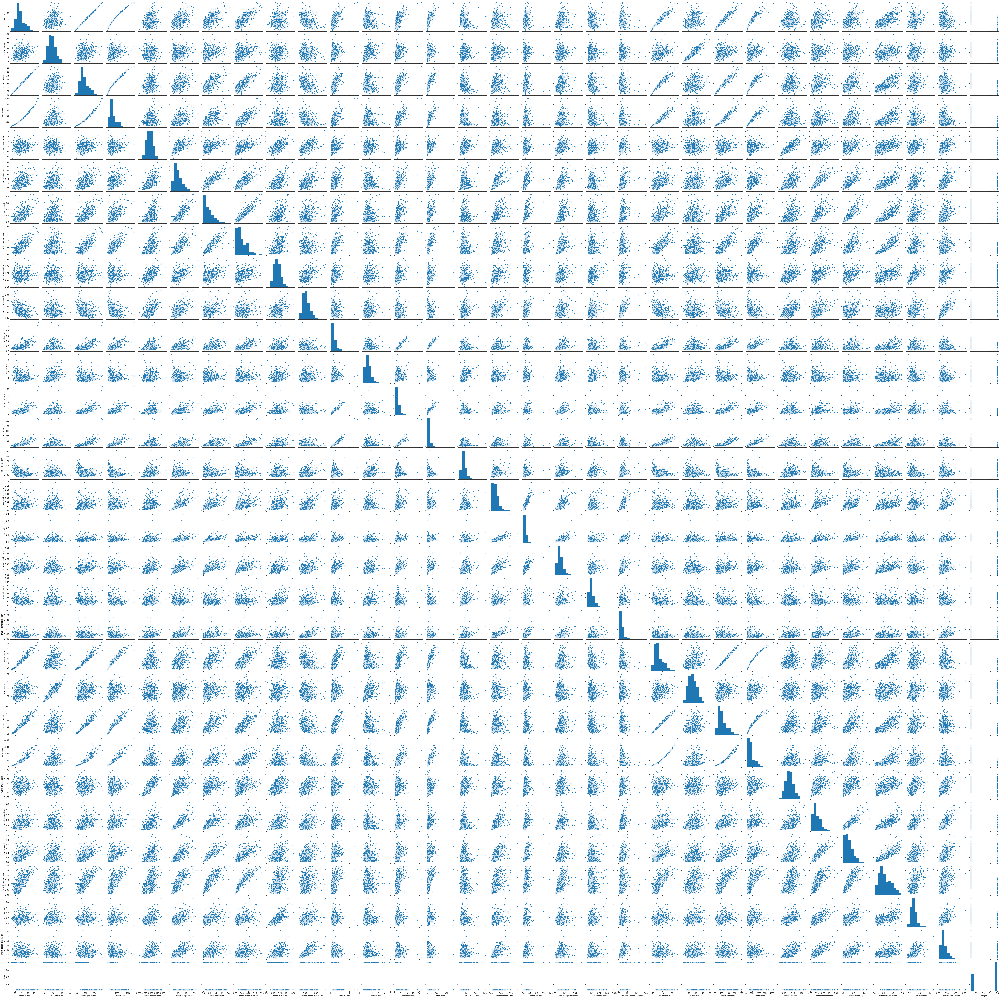

In [36]:
#visualize pair plots
sn.pairplot(X1)

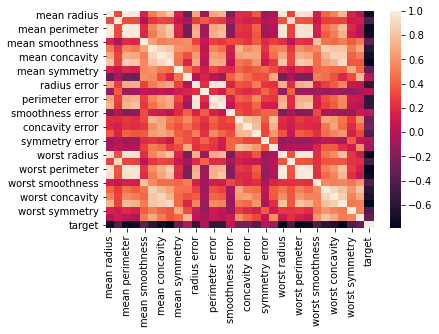

In [6]:
#visualize heatmap
dataplot=sn.heatmap(X1.corr())
mp.show()

In [48]:
Y1= X1.target
X1a = X1.drop(columns=['target'])
x_train, x_test, y_train, y_test = train_test_split(X1a, Y1, test_size=0.30, random_state=0)

In [49]:
#linear support vector classifier

from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, f1_score

lsvc = LinearSVC()
lsvc.fit(x_train, y_train)
lsvc_train_pred = lsvc.predict(x_train)
lsvc_test_pred = lsvc.predict(x_test)
cfmatrix_train1 = confusion_matrix(y_train,lsvc_train_pred)
cfmatrix_train1

C:\Users\ysayw\anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


array([[117,  32],
       [  2, 247]], dtype=int64)

In [50]:
cfmatrix_train2 = confusion_matrix(y_test,lsvc_test_pred)
cfmatrix_train2


array([[ 56,   7],
       [  1, 107]], dtype=int64)

In [51]:
accuracy_score(y_test,lsvc_test_pred)

0.9532163742690059

In [52]:

print(classification_report(y_test,lsvc_test_pred))

              precision    recall  f1-score   support

         0.0       0.68      0.98      0.81        63
         1.0       0.99      0.73      0.84       108

    accuracy                           0.82       171
   macro avg       0.83      0.86      0.82       171
weighted avg       0.87      0.82      0.83       171



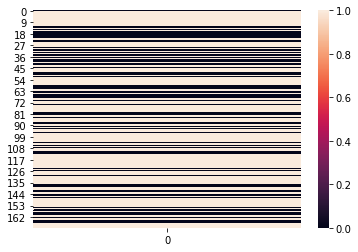

In [32]:
#data = np.asarray(lsvc_test_pred).reshape(171, 1)
#data = np.reshape(lsvc_test_pred, (171, 1))
#the reverse of above , which is supposed to convert a 1d array to a 2d, but only seems to convert a 1d to a 1d.
#data2 = np.reshape(y_test, (171, 1))

#print(y_test)

#data2 = np.asarray(y_test).reshape(171,1)
#data = np.asarray([[lsvc_test_pred]])
#data = np.asarray([[data]])
#sn.heatmap(lsvc_test_pred.to_frame())
sn.heatmap(lsvc_test_pred[:, np.newaxis])
#sn.heatmap(y_test, y_test)
#dataplot = sn.heatmap(y_test, lsvc_test_pred)
#dataplot=sn.heatmap(y_test, data)
#dataplot=sn.heatmap(data2, data)


mp.show()

In [67]:
#Support Vector Classifier

svc1 = make_pipeline(StandardScaler(), SVC(gamma='auto',kernel='poly', degree=2))

svc1.fit(x_train, y_train)
svc_train_pred1 = svc1.predict(x_train)
svc_test_pred1 = svc1.predict(x_test)
cfmatrix_train1 = confusion_matrix(y_train,svc_train_pred1)
cfmatrix_train1

array([[ 90,  59],
       [  5, 244]], dtype=int64)

In [64]:
accuracy_score(y_train,svc_train_pred1)

0.8391959798994975

In [68]:
print(classification_report(y_train,svc_train_pred1))

              precision    recall  f1-score   support

         0.0       0.95      0.60      0.74       149
         1.0       0.81      0.98      0.88       249

    accuracy                           0.84       398
   macro avg       0.88      0.79      0.81       398
weighted avg       0.86      0.84      0.83       398



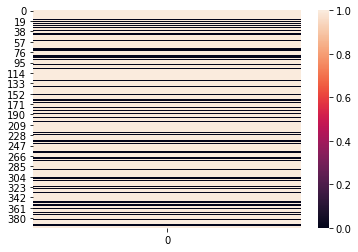

In [40]:
sn.heatmap(svc_train_pred1[:, np.newaxis])

In [65]:
cfmatrix_train2 = confusion_matrix(y_test,svc_test_pred1)
cfmatrix_train2

array([[ 30,  33],
       [  7, 101]], dtype=int64)

In [69]:
accuracy_score(y_test,svc_test_pred1)

0.7660818713450293

In [64]:
print(classification_report(y_test,svc_test_pred1))

              precision    recall  f1-score   support

         0.0       0.81      0.48      0.60        63
         1.0       0.75      0.94      0.83       108

    accuracy                           0.77       171
   macro avg       0.78      0.71      0.72       171
weighted avg       0.77      0.77      0.75       171



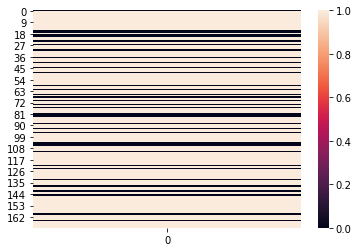

In [41]:
sn.heatmap(svc_test_pred1[:, np.newaxis])

In [70]:
#Support Vector Classifierr 2

svc2 = make_pipeline(StandardScaler(), SVC(gamma=.5,kernel='rbf', degree=2, C=0.1))
svc2.fit(x_train, y_train)
svc_train_pred2 = svc2.predict(x_train)
svc_test_pred2 = svc2.predict(x_test)

#This area is for the training SVC classifier 2.

cfmatrix_train2 = confusion_matrix(y_train,svc_train_pred2)
cfmatrix_train2

array([[  0, 149],
       [  0, 249]], dtype=int64)

In [71]:
accuracy_score(y_train,svc_train_pred2)

0.6256281407035176

In [72]:
print(classification_report(y_train,svc_train_pred2))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       149
         1.0       0.63      1.00      0.77       249

    accuracy                           0.63       398
   macro avg       0.31      0.50      0.38       398
weighted avg       0.39      0.63      0.48       398



C:\Users\ysayw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


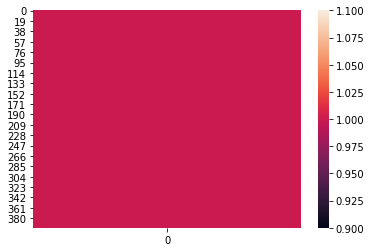

In [42]:
sn.heatmap(svc_train_pred2[:, np.newaxis])

In [73]:
#This section for SVC 2 test
cfmatrix_train2 = confusion_matrix(y_test,svc_test_pred2)
cfmatrix_train2

array([[  0,  63],
       [  0, 108]], dtype=int64)

In [74]:
accuracy_score(y_test,svc_test_pred2)

0.631578947368421

In [67]:
print(classification_report(y_test,svc_test_pred2))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        63
         1.0       0.63      1.00      0.77       108

    accuracy                           0.63       171
   macro avg       0.32      0.50      0.39       171
weighted avg       0.40      0.63      0.49       171



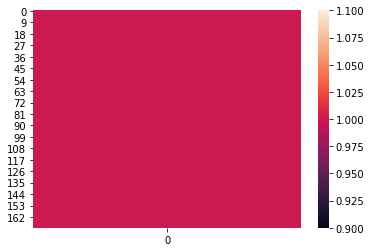

In [35]:
sn.heatmap(svc_test_pred2[:, np.newaxis])

e: out of all the test performed, the Linear SVC had the highest accuracy, around .95 on the test set, with poly SVC coming in second at around at .70, while the SVC with kernel rbf settings performed the worst, hovering around .62 for training and .63 for tests. RBF predicts by grouping objects together, polynomial works with equations that possibly have polynomial or exponential functions, and linear assumes that the line of best fit is linear. In this case, the data is not particularly restricted into groups, so RBF functions less well, while the line of best fit is moderately accurate, leading to better polynomial and linear SVC scores. 

Perform Decision Tree algorithm on the below decisionTree.csv dataset in python. (Final column target class is the target variable) [50Pts].

a) Split the original dataset in 70/30 ratio for train and test set then perform Decison Tree algorithm (from sklearn.tree import DecisionTreeClassifier) with criterion as gini, max depth=3, random state=0. Print the train and test set accuracies and visualize the decision tree.

b) Split the original dataset in 70/30 ratio for train and test set then perform Decison Tree algorithm (from sklearn.tree import DecisionTreeClassifier) with criterion as entropy, max depth=3, random state=0. Print the train and test set accuracies and visualize the decision tree.

In [14]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn import tree
from sklearn.tree import export_text

le = preprocessing.LabelEncoder()

X2 = pd.read_csv('decisionTree.csv')

In [3]:
X2.head()

,buying,maint,doors,persons,lug_boot,safety,target_class
0,vhigh,vhigh,2,2,small,med,unacc
1,vhigh,vhigh,2,2,small,high,unacc
2,vhigh,vhigh,2,2,med,low,unacc
3,vhigh,vhigh,2,2,med,med,unacc
4,vhigh,vhigh,2,2,med,high,unacc


In [3]:
for col in X2:
  print(X2[col].unique())

['vhigh' 'high' 'med' 'low']
['vhigh' 'high' 'med' 'low']
['2' '3' '4' '5more']
['2' '4' 'more']
['small' 'med' 'big']
['med' 'high' 'low']
['unacc' 'acc' 'vgood' 'good']


In [5]:
X2.buying = le.fit_transform(X2['buying'])
X2.maint = le.fit_transform(X2['maint'])
X2.doors = le.fit_transform(X2['doors'])
X2.persons = le.fit_transform(X2['persons'])
X2.lug_boot = le.fit_transform(X2['lug_boot'])
X2.safety = le.fit_transform(X2['safety'])
X2.target_class = le.fit_transform(X2['target_class'])




In [6]:
X2.head()

,buying,maint,doors,persons,lug_boot,safety,target_class
0,3,3,0,0,2,2,2
1,3,3,0,0,2,0,2
2,3,3,0,0,1,1,2
3,3,3,0,0,1,2,2
4,3,3,0,0,1,0,2


In [7]:

Y2= X2.target_class
X3 = X2.drop(columns=['target_class'])

X2_train, X2_test, Y2_train, Y2_test = train_test_split(X3, Y2, test_size=0.30, random_state=0)



In [9]:
#DTC 1
clf = DecisionTreeClassifier(criterion='gini',max_depth=3,random_state=0)
model2a = clf.fit(X2_train, Y2_train)
dt_predy1 = model2a.predict(X2_train)
print(accuracy_score(Y2_train, dt_predy1))
#training accuracy

0.7831125827814569


In [42]:
#DTC 2
clf = DecisionTreeClassifier(criterion='entropy',max_depth=3,random_state=0)
model2b=clf.fit(X2_train, Y2_train)
dt_predy2a = model2b.predict(X2_test)
print(accuracy_score(Y2_test, dt_predy2a))
#test accuracy

0.74373795761079


In [15]:
tree.export_text(model2a)

'|--- feature_3 <= 0.50\n|   |--- class: 2\n|--- feature_3 >  0.50\n|   |--- feature_5 <= 0.50\n|   |   |--- feature_1 <= 2.50\n|   |   |   |--- class: 0\n|   |   |--- feature_1 >  2.50\n|   |   |   |--- class: 2\n|   |--- feature_5 >  0.50\n|   |   |--- feature_5 <= 1.50\n|   |   |   |--- class: 2\n|   |   |--- feature_5 >  1.50\n|   |   |   |--- class: 2\n'

In [41]:
dt_predy2a = model2b.predict(X2_train)
print(accuracy_score(Y2_train, dt_predy2a))
#training accuracy

0.7831125827814569


In [11]:
dt_predy2b = model2b.predict(X2_test)
print(accuracy_score(Y2_test, dt_predy2b))
#Test accuracy


0.7861271676300579


In [16]:
tree.export_text(model2b)

'|--- feature_3 <= 0.50\n|   |--- class: 2\n|--- feature_3 >  0.50\n|   |--- feature_5 <= 0.50\n|   |   |--- feature_1 <= 2.50\n|   |   |   |--- class: 0\n|   |   |--- feature_1 >  2.50\n|   |   |   |--- class: 0\n|   |--- feature_5 >  0.50\n|   |   |--- feature_5 <= 1.50\n|   |   |   |--- class: 2\n|   |   |--- feature_5 >  1.50\n|   |   |   |--- class: 0\n'